# **BMI 567/667 Tutorial on the Application of Networks to scRNA-seq Analysis**
______________
Created by Jennifer Sullivan (sulljenn@ohsu.edu)
______________
The purpose of this tutorial is to offer hands-on experience in clustering, visualizing, and inferring a cell fate trajectory for a real scRNA-seq dataset.  A key aim of this tutorial is to reinforce concepts of how networks are used in scRNA-seq analysis, and to offer insight into the decisions involved in constructing and using these networks to obtain meaningful insights about the data.

This tutorial is constructed from the following two tutorials:

[Preprocessing and clustering 3k PBMCs](https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html)  
[Trajectory inference for hematopoiesis in mouse](https://scanpy-tutorials.readthedocs.io/en/latest/paga-paul15.html)

The dataset used in this tutorial is from [Paul et al., 2015](https://www.cell.com/cell/fulltext/S0092-8674(15)01493-2?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS0092867415014932%3Fshowall%3Dtrue).  The cells in this dataset were sampled from the bone marrow of adult mice and enriched for myeloid progenitor lineage cells.  They represent different stages of hematopoiesis.  A simplified illustration of hematopoiesis is shown in the figure below, with the left side displaying the myeloid progenitor lineages.

![hematopoiesis](./images/hematopoiesis.jpeg "hematopoiesis")

Image credit: A. Rad and Mikael Häggström, M.D. Author info - Reusing images- Conflicts of interest:  NoneMikael Häggström, M.D.Example citation (in caption or footnote):- "By A. Rad and M. Häggström. CC-BY-SA 3.0 license.", CC BY-SA 3.0 <http://creativecommons.org/licenses/by-sa/3.0/>, via Wikimedia Commons, website: https://en.wikipedia.org/wiki/Myeloid_tissue

This dataset was used in the article introducing the PAGA algorithm ([Wolf et al.](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-019-1663-x)) to demonstrate this cell fate trajectory inference method.  By and large, we will be following the workflow used to infer one of the trajectories in the paper, as well as exploring the effects of changing the parameters at different steps along the way.

## **Set-up**

Let's start by importing the packages we will need.

In [70]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
from matplotlib import rcParams
import scanpy as sc
import warnings

Let's adjust our message settings.

In [71]:
# Ignore all warnings
warnings.filterwarnings('ignore')

Let's also import the dataset we will be using.  This dataset is stored in the Scanpy package as a built-in sample dataset, so we will access it from this package.

In [72]:
adata = sc.datasets.paul15()
adata

AnnData object with n_obs × n_vars = 2730 × 3451
    obs: 'paul15_clusters'
    uns: 'iroot'

## **Exploratory Data Analysis (EDA)**
The focus of this tutorial is on the application of networks to scRNA-seq.  Therefore, we won't spend a lot of time on EDA and data processing (next section).  However, to get meaningful results, it's important to understand the data we are working with, to clean the dataset as much as possible, and to correct for any variables that are likely to confound the biological variability we are interested in.  (In other words... garbage in, garbage out, so do your best to not put in garbage.)  Thus, we will spend a few minutes going over the basics of how to understand and process our dataset.

Here we will explore our dataset to make sure it doesn't have any concerning issues.

For scRNA-seq data, there are three primary concerns about the quality of the samples:

1. the cells are stressed, broken, or killed
2. the capture sites did not capture an actual cell
3. the capture sites captured more than one cell

Through the development of a machine learning model, the following features were found to generally be predictive of cell damage, or of capture sites with non-singular numbers of cells:

1. the number of genes detected in each cell
2. the number of unique reads (a.k.a. UMIs) detected in each cell
3. the percentage of reads that map to the mitochondrial genome

Source: Ilicic T, Kim JK, Kolodziejczyk AA, Bagger FO, McCarthy DJ, Marioni JC, et al. Classification of low quality cells from single-cell RNA-seq data. Genome Biology [Internet]. 2016;17. Available from: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4758103/

When a cell’s membrane is damaged, the cell loses its cytoplasmic RNA, but the RNA enclosed in its mitochondria will be retained. Therefore, the total number of transcripts captured (and therefore the number of unique reads and the number of genes detected) will tend to be lower, while the proportion of the reads mapping to the mitochondrial genome will tend to be higher. Generally, for mice, a high proportion of mitochondrial genes is considered to be over roughly 5%. For humans, it’s considered to be over roughly 10%. However, these percentages can vary for different tissues and cell types.

Source: Osorio D, Cai JJ. Systematic determination of the mitochondrial proportion in human and mice tissues for single-cell RNA-sequencing data quality control. Bioinformatics. 2021 May 17;37(7):963–7.

In addition, while empty capture sites can contain cell-free RNA, the number of transcripts in these sites will tend to be lower, while capture sites containing more than one cell will accordingly tend to have higher numbers of transcripts captured.



So let’s look at the distributions of these measures.  One thing we would look for is a bimodal distribution, which could indicate a subpopulation of damaged cells or capture sites with no cell or multiple cells.

First we need to identify all of the mitochondrial genes.

In [73]:
# For each gene, annotate whether it came from the mitochondrial genome or not.
adata.var["mt"] = adata.var_names.str.lower().str.startswith("mt")

# For each cell, calculate the percentage of reads that came from the mitochondrial genome.
sc.pp.calculate_qc_metrics(adata, qc_vars = ["mt"], percent_top = None, log1p = False, inplace = True)

Now we can plot the distributions of genes, UMIs, and percentage of mitochondrial reads.

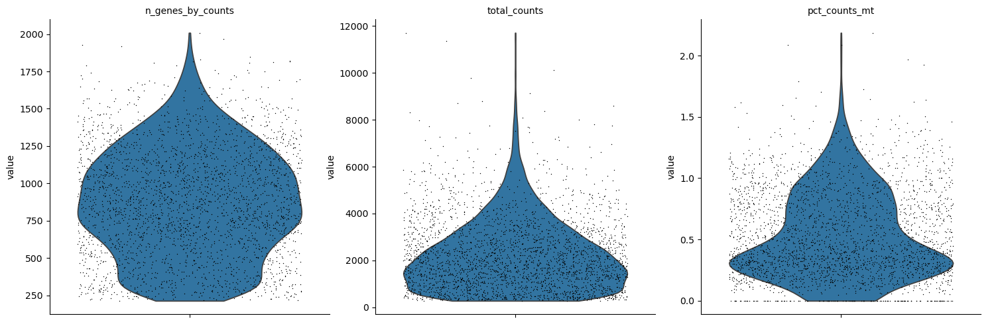

In [74]:
sc.pl.violin(adata, ["n_genes_by_counts", "total_counts", "pct_counts_mt"], jitter = 0.4, multi_panel = True)

Let's also visualize the relationships between these different metrics to get a better picture of the cells. An example of what we might look for here is whether there is a population of cells that have both a small library size (few reads) and low complexity (few genes mapped). This would suggest that there just weren’t enough transcripts read in those cells to get a good representation of the genes expressed. Another example would be cells with a high proportion of mitochondrial genes and a low number of reads or genes detected. This would suggest that cell damage or apoptosis prevented the capture of the cells’ transcriptome.

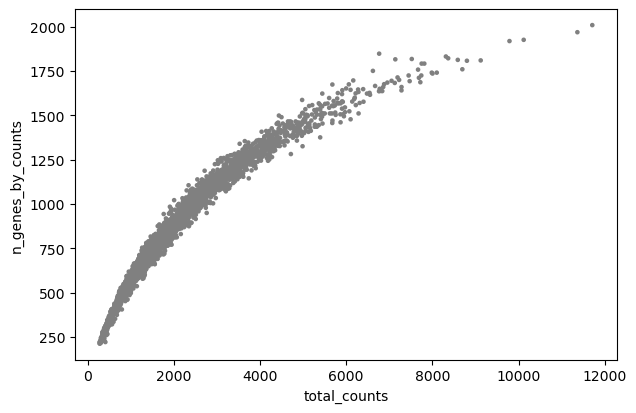

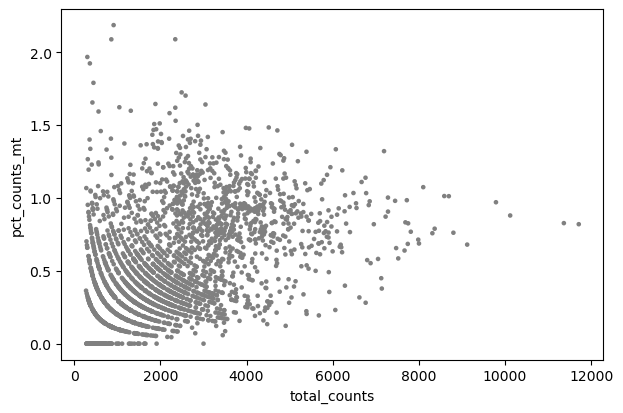

In [75]:
sc.pl.scatter(adata, x = "total_counts", y = "n_genes_by_counts")
sc.pl.scatter(adata, x = "total_counts", y = "pct_counts_mt")

## **Processing the data**
Once we have examined our dataset and identified any issues, we need to process the dataset.  The objective at this stage is to address any technical factors, or in some cases, biological factors that are not of interest for our research question, that could confound our results.  While the required processing steps may differ for each dataset, they can include the following:

* filtering of low-quality cells and uninformative genes
* removal of potential doublets
* normalization of the expression values to correct for differences in library size
* correction for other confounding variables
* any other processing needed to address concerns about the data

By processing the dataset, we aim to achieve the most accurate representation of the true *relative* expression values of the genes across all of the cells.

In this case, we will use a very simple processing workflow.  This workflow is very similar to that used in the PAGA paper, introduced in [Zheng et al., 2017](https://www.nature.com/articles/ncomms14049).  We will follow a slightly modified version of this workflow for basic data processing, as well as for preparing the data for clustering in the section below.

First, we will simply eliminate the genes not represented in the counts data.

In [76]:
# Filter out any genes with fewer than two UMIs.
sc.pp.filter_genes(adata, min_counts = 1)

Then we will perform a simple normalization procedure to represent the expression of each gene as some fraction of the cell's total expression.

In [77]:
# Normalize the data.
sc.pp.normalize_total(adata, target_sum = 1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


## **Preparing the data for clustering**
Once we have accounted for the technical factors in our dataset, we need to do some additional processing of our data to get it into a form that will better inform the clustering procedure.  Specifically, we need to identify the set of the most variable genes, and we need to reduce the dimensionality of our data.

### **Feature Selection**
The first step in clustering the cells is to select the genes used to inform the clustering procedure.  Differences in cell types are indicated by differences in gene expression values.  Therefore, expression variance is necessary to distinguish cell types.  Relatively invariant genes are not very informative and may actually introduce noise, rather than real biological signal.  Therefore, research groups have found that by focusing only on the most variable genes (genes highly expressed in some cells and lowly expressed in others), they are better able to uncover real signal and distinguish biologically distinct cell clusters.

Source: Brennecke P, Anders S, Kim JK, Kołodziejczyk AA, Zhang X, Proserpio V, et al. Accounting for technical noise in single-cell RNA-seq experiments. Nat Methods. 2013 Nov;10(11):1093–5.

Let's identify the most variable genes.  Following the workflow from [Zheng et al., 2017](https://www.nature.com/articles/ncomms14049), we will identify the top 1,000 most variable genes.

In [78]:
sc.pp.highly_variable_genes(adata, flavor = "cell_ranger", n_top_genes = 1000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Let's look at a few of the most variable genes.

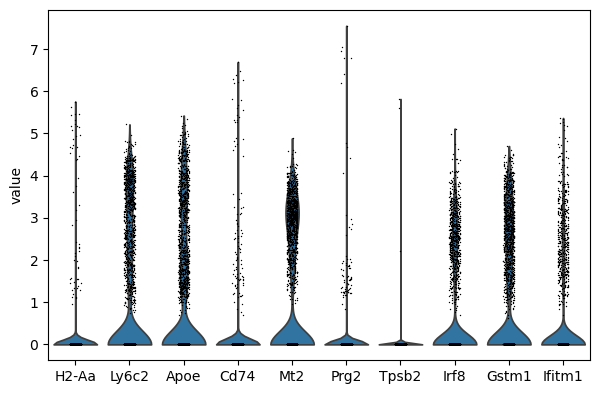

In [79]:
# Sort the genes based on their variability and save the sorted gene indices.
gene_indices_sorted_by_variability = adata.var["dispersions_norm"].argsort()

# Reverse the order so that the most variable genes will be at the top.
gene_indices_sorted_by_variability = gene_indices_sorted_by_variability[::-1]

# Select the top 10 indices for the most variable genes.
top_10_indices_of_var_genes = gene_indices_sorted_by_variability[:10]

# Get the names of the top 10 most variable genes.
top_10_var_genes = adata.var_names[top_10_indices_of_var_genes]

# Plot the distribution of expression values for the top 10 most variable genes.
sc.pl.violin(adata, keys = top_10_var_genes)

Below, we will be scaling the data, which will affect our visualizations of gene expression.  Therefore, let's save this unscaled version of our data for later use.

In [80]:
adata.layers["unscaled_data"] = adata.X.copy()

### **Dimensionality reduction**
The previous step of feature selection reduced the features in our dataset down to the most potentially informative genes. However, the number of genes is still quite large, leaving us with a dataset that is still quite complex. With such a large number of dimensions, the distances between pairs of cells become more uniform, making it difficult to discern which cells are more similar to each other than others. Fortunately, RNA-seq datasets display a great deal of redundant information, as many genes are co-regulated and co-expressed, resulting in highly correlated expression patterns. It is these patterns of co-expression that often distinguish one cell type from another, as different sets of genes are differentially regulated to perform differing functions in each cell type. Therefore, we can reduce the complexity of the data by representing each combination of correlated features as a single feature and eliminating redundant information. We can then select a subset of these new features to eliminate less dramatic differences in expression that are likely noise. In other words, we can try to extract the essence of the dataset relevant to our goal of identifying distinct cell types, while ignoring the aspects of the data that are not strongly linked to our objective.

Source: Kharchenko PV. The triumphs and limitations of computational methods for scRNA-seq. Nat Methods. 2021 Jul;18(7):723–32.

Because we aim to distinguish different cell types based on differences in their transcriptional profiles, we will again focus on identifying the dimensions of the data that display the greatest variability. In this case, rather than identifying genes with the greatest variance, we will perform principal components analysis (PCA) to identify the combined contributions of genes that produce the greatest dispersions of the cells in the dataset. Because all of the principal components obtained by this analysis are orthogonal to one another, they represent non-redundant dimensions of the data. These non-redundant dimensions likely represent sets of genes whose correlated expression patterns distinguish different cell types.

#### **Scaling**
Before we can perform PCA, we must first scale our data so that each gene has mean expression across all cells of 0 and variance across all cells of 1. This step is crucial for PCA, as genes with especially high mean and/or variance can dominate the analysis, biasing the first principal components to highlight the extreme differences in absolute expression produced only by those genes. What we are really interested in capturing through PCA are relative differences in the cells’ expression profiles, as a small, but significant change in one gene can be more biologically relevant than a large, but proportionally less significant change in another gene. Scaling the genes’ expression values in this way thus gives equal weight to the relative expression changes of all of the genes.

In [81]:
# Scale the data to unit variance and shift the mean to 0.
sc.pp.scale(adata)

#### **Principal Components Analysis (PCA)**
Now we will select the number of principal components (PCs) to use for clustering. The goal is to try to select the PCs that actually distinguish distinct cell types, and to eliminate any PCs that capture only the differences between cells that belong to the same cell type. Of course, we do not know which PCs actually capture the relevant differences between cell types, so we do our best to estimate the correct number to use by examining the percentage of the variance in the data that each principal component explains.

Again, at this stage, we are simply trying to reproduce the results from the PAGA paper, so we will follow their lead.

In [82]:
# Calculate the principal components (PCs) of the data.
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


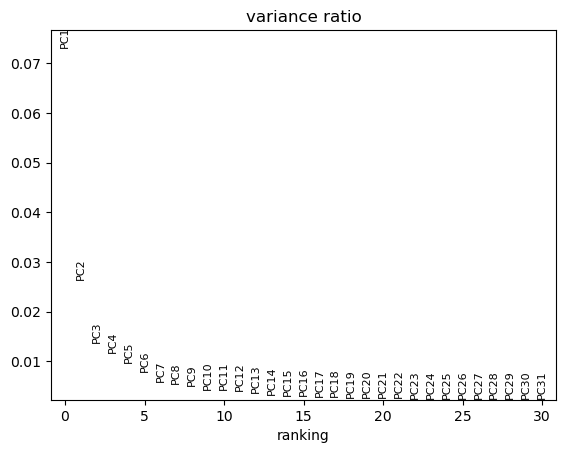

In [83]:
# Plot the percentage of the variance in the data that is explained by each PC.
sc.pl.pca_variance_ratio(adata)

## **Clustering**
The calculated PCs can now be used as features to cluster the cells.

We will cluster the cells using a graph-based approach consisting of the following steps:

1. The cells are connected in a k-nearest neighbors (kNN) graph based on their transcriptional similarity.
2. The kNN graph is partitioned into non-overlapping clusters.

### **Constructing the kNN graph**
First, let's construct the kNN graph using the same parameters that were used in the PAGA paper.

In [84]:
# Construct the kNN graph.
sc.pp.neighbors(adata, n_neighbors=4, n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


### **Visualizing cell-cell similarity relationships**
Now remember that the graph-based visualization methods, t-SNE and UMAP, also use this kNN graph to encode the degree of similarity between cells for the purpose of producing their 2D or 3D display of the data.  So technically, even though we have not actually partitioned the data into clusters, we can at this point, visualize our dataset in these low dimensions.

So let's do that.  Specifically, let's use the UMAP algorithm to display our dataset.

In [85]:
# Calculate the UMAP coordinates.
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


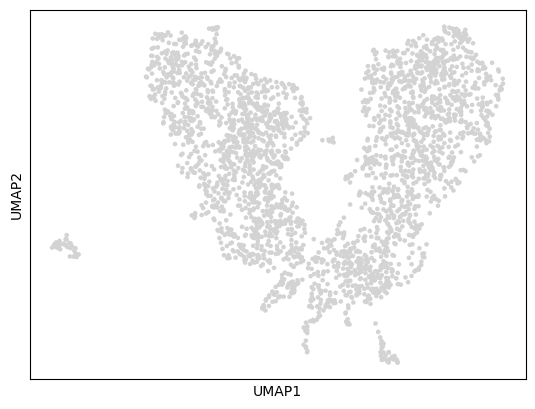

In [86]:
sc.pl.umap(adata)

Hmmm... pretty boring.  That's because we're not plotting any information about the cells other than their calculated coordinates in 2D space.  However, these coordinates do reflect the transcriptional similarity of the cells, so that is what we are seeing here.

Let's see if we can visualize some additional information about the cells before we actually cluster them.

Let's pull up our top 10 most variable genes again.

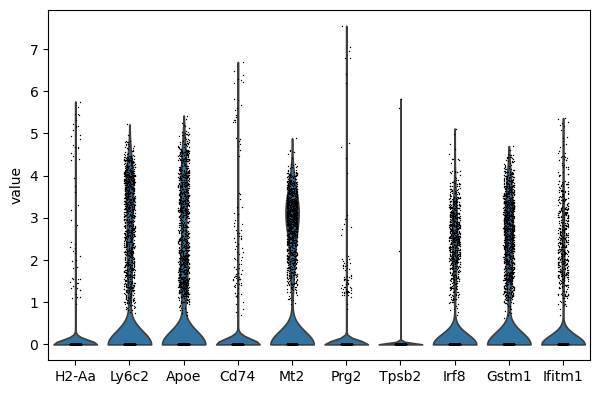

In [87]:
# Plot the distribution of expression values for the top 10 most variable genes.
sc.pl.violin(adata, layer = "unscaled_data", keys = top_10_var_genes)

Let's visualize the expression of each of these genes across all of the cells in the 2D UMAP space.

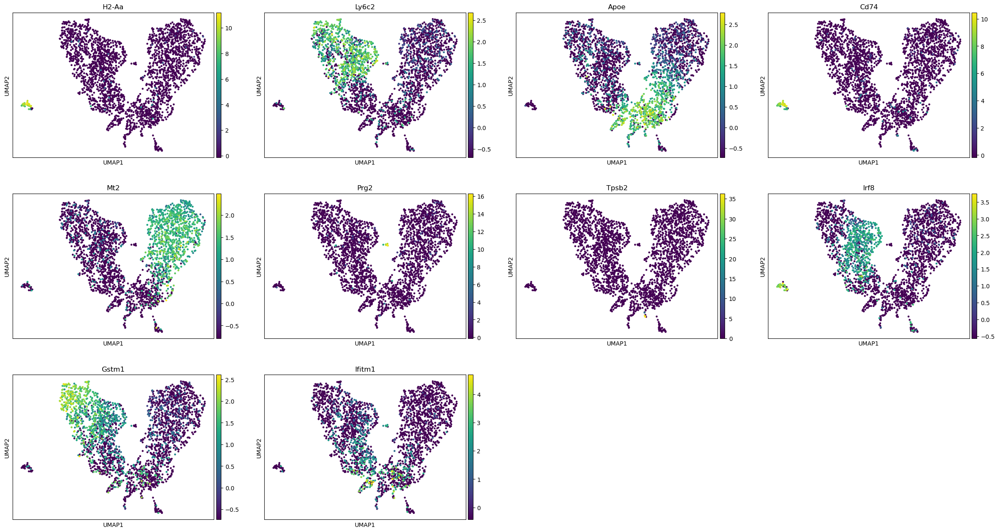

In [88]:
sc.pl.umap(adata, color = top_10_var_genes)

Let's see if we can see similar patterns in PCA plots.

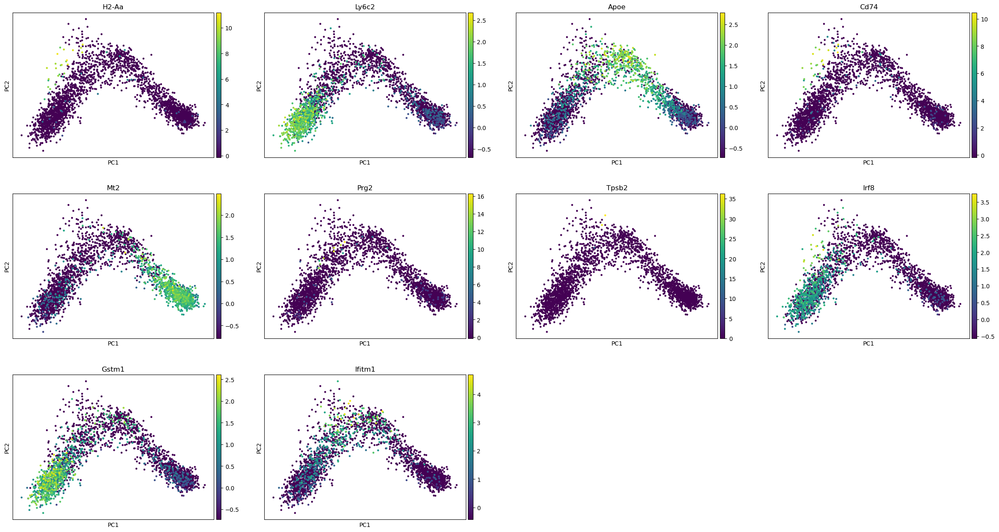

In [89]:
sc.pl.pca(adata, color = top_10_var_genes)

### **Partitioning the kNN Graph**
Now that we have constructed the kNN graph and examined a few of the genes that were used to determine the similarity between the cells, let's go ahead and actually partition this graph to see how the cells cluster.

For now, we will use the default resolution value of 1.

In [90]:
# Partition the kNN graph to identify cell clusters.
sc.tl.leiden(adata, resolution = 1)

running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


### **Visualizing the clusters**
Let's see what our cell clusters look like in UMAP space.

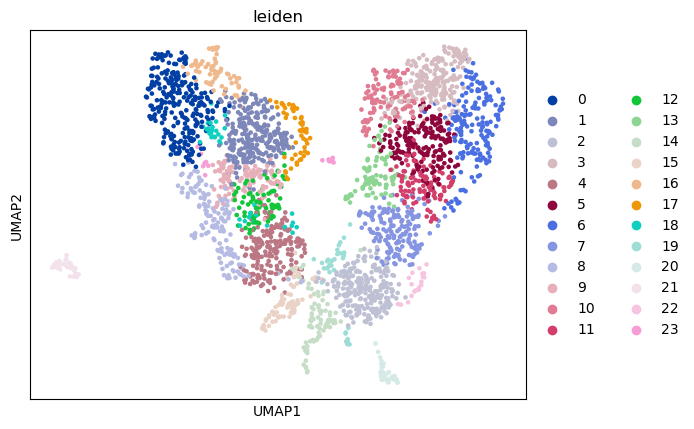

In [91]:
# Plot the colors onto the UMAP plot.
sc.pl.umap(adata, color = "leiden")

Can we distinguish these clusters based on the first two PCs?

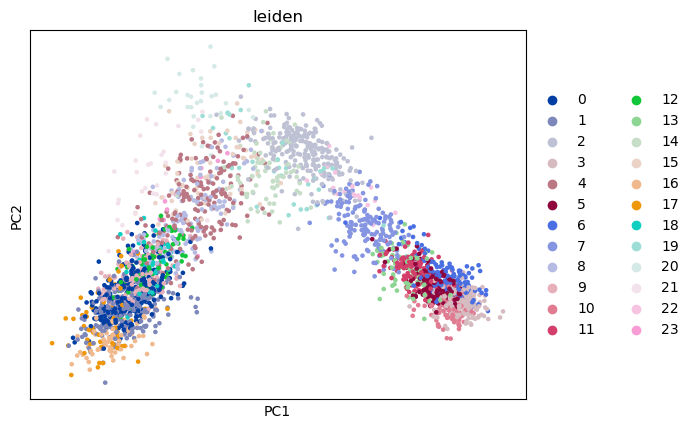

In [92]:
# Plot the colors onto the PCA plot.
sc.pl.pca(adata, color = "leiden")

### **Annotating the clusters**
Ultimately, the goal of clustering is not to simply group the cells, but to actually try to identify what the cells are.  So let's try to get an idea of how successful we were in identifying some known cell types by seeing if we can infer the identities of the cells in our various clusters.

For this dataset, we have known marker genes that we can use to try to annotate our clusters.  Let's see if we can match any of our clusters to the cell types associated with these markers.

Here is our information about marker genes for this dataset:

In [93]:
erythroid_markers = ["Gata1", "Klf1", "Epor", "Gypa", "Hba-a2"]
neutrophil_markers = ["Elane", "Cebpe", "Gfi1"]
monocyte_markers = ["Irf8", "Csf1r"]
megakaryocyte_markers = ["Itga2b", "Pbx1", "Sdpr", "Vwf"]
basophil_markers = ["Mcpt8", "Prss34"]
mast_cell_markers = ["Cma1", "Gzmb"]

**cell type: erythroid**

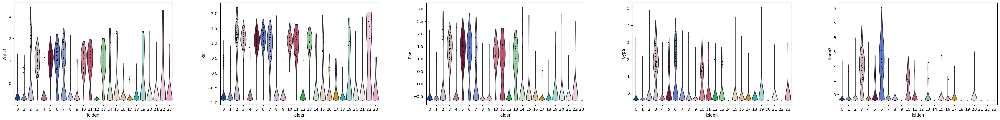

In [94]:
sc.pl.violin(adata, keys = erythroid_markers, groupby = "leiden")

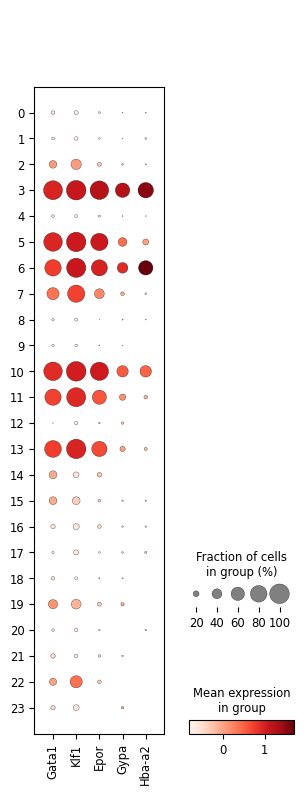

In [95]:
sc.pl.dotplot(adata, var_names = erythroid_markers, groupby = "leiden")

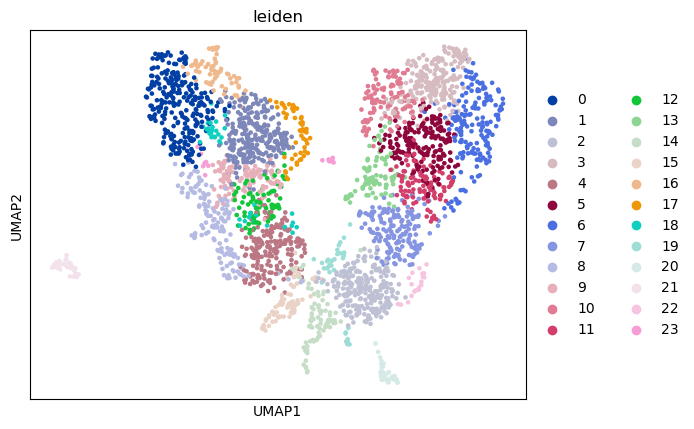

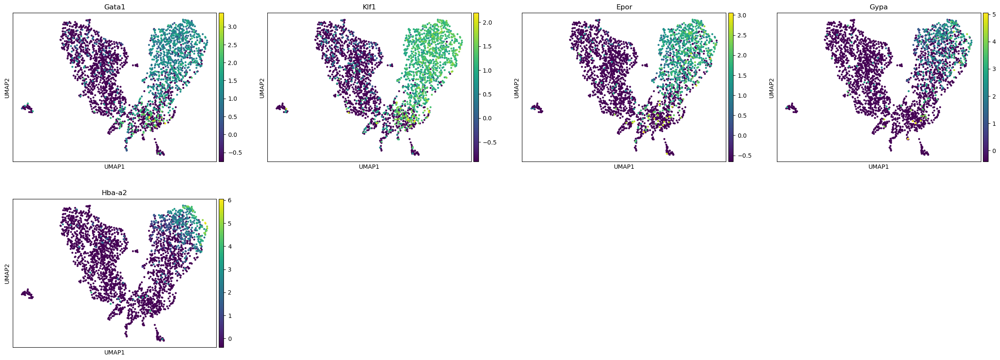

In [96]:
sc.pl.umap(adata, color = "leiden")
sc.pl.umap(adata, color = erythroid_markers)

**cell type: neutrophils**

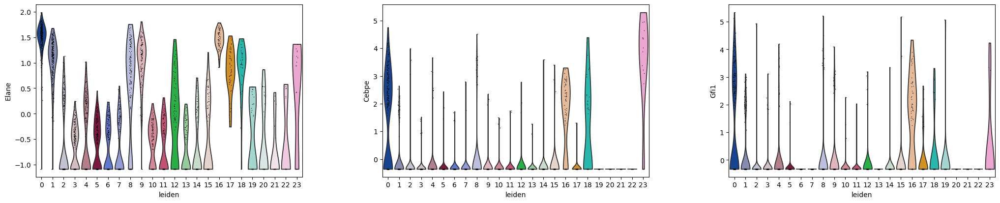

In [97]:
sc.pl.violin(adata, keys = neutrophil_markers, groupby = "leiden")

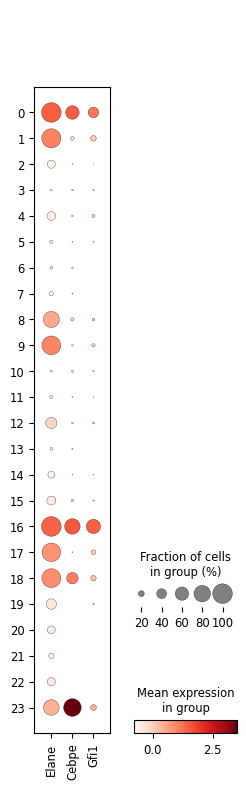

In [98]:
sc.pl.dotplot(adata, var_names = neutrophil_markers, groupby = "leiden")

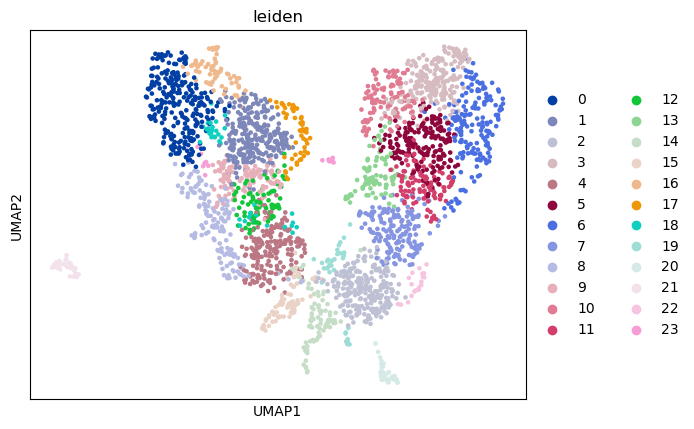

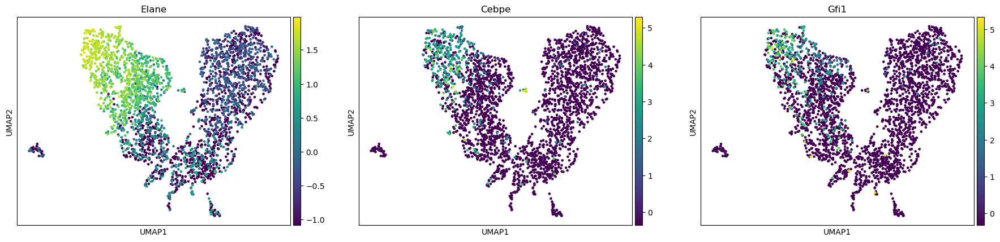

In [99]:
sc.pl.umap(adata, color = "leiden")
sc.pl.umap(adata, color = neutrophil_markers)

**cell type: monocytes**

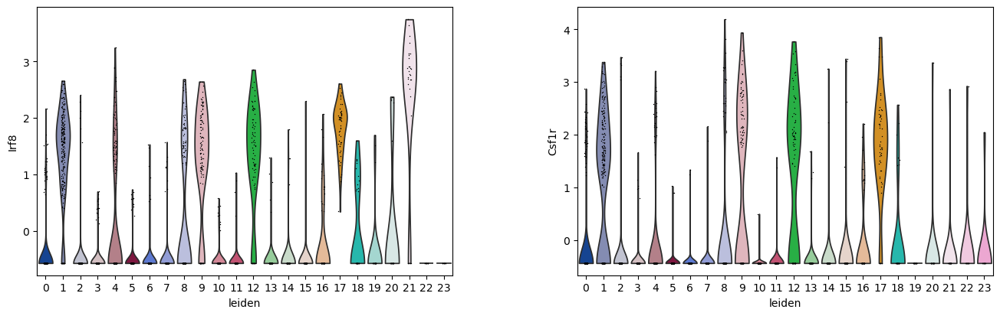

In [100]:
sc.pl.violin(adata, keys = monocyte_markers, groupby = "leiden")

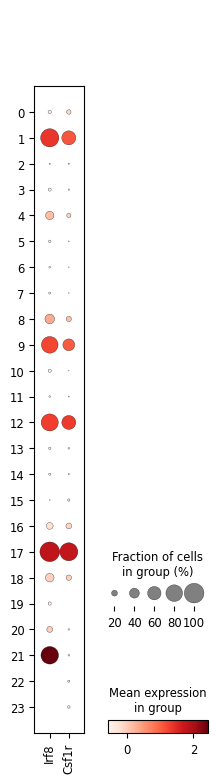

In [101]:
sc.pl.dotplot(adata, var_names = monocyte_markers, groupby = "leiden")

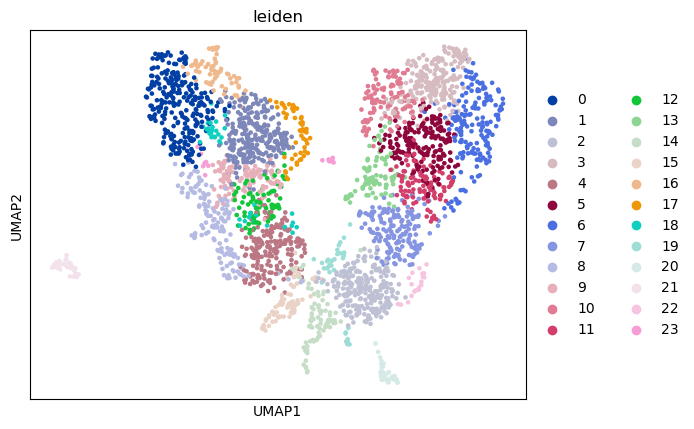

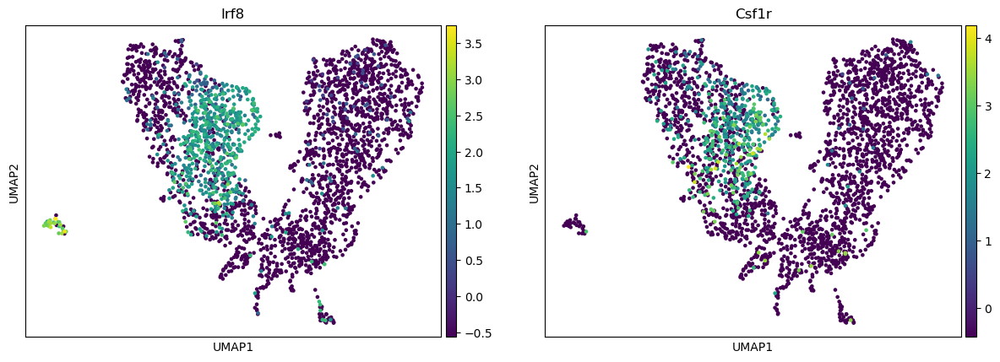

In [102]:
sc.pl.umap(adata, color = "leiden")
sc.pl.umap(adata, color = monocyte_markers)

**cell type: megakaryocytes**

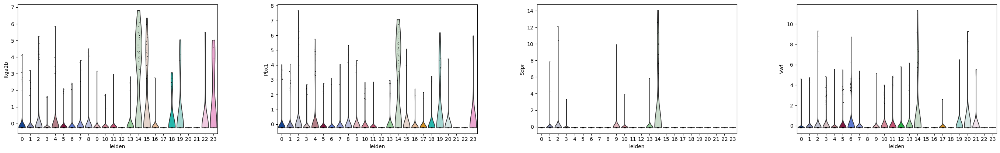

In [103]:
sc.pl.violin(adata, keys = megakaryocyte_markers, groupby = "leiden")

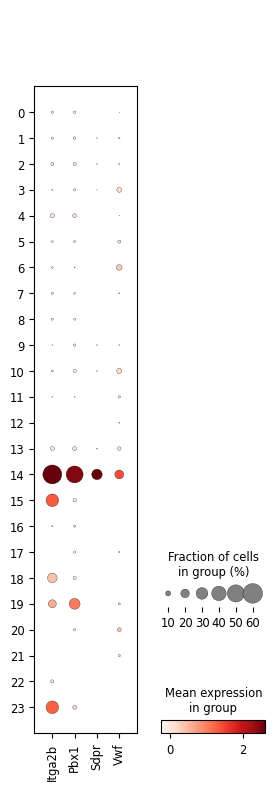

In [104]:
sc.pl.dotplot(adata, var_names = megakaryocyte_markers, groupby = "leiden")

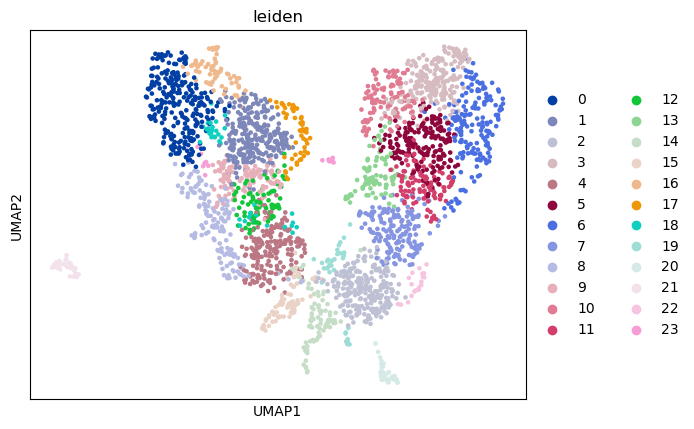

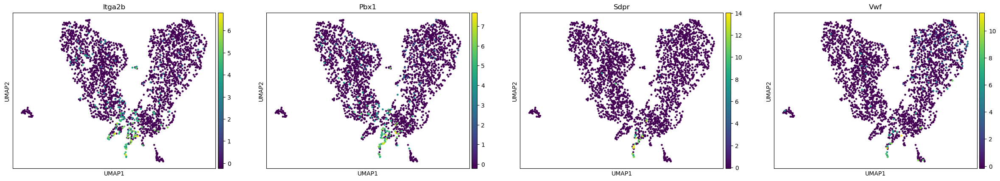

In [105]:
sc.pl.umap(adata, color = "leiden")
sc.pl.umap(adata, color = megakaryocyte_markers)

**cell type: basophils**

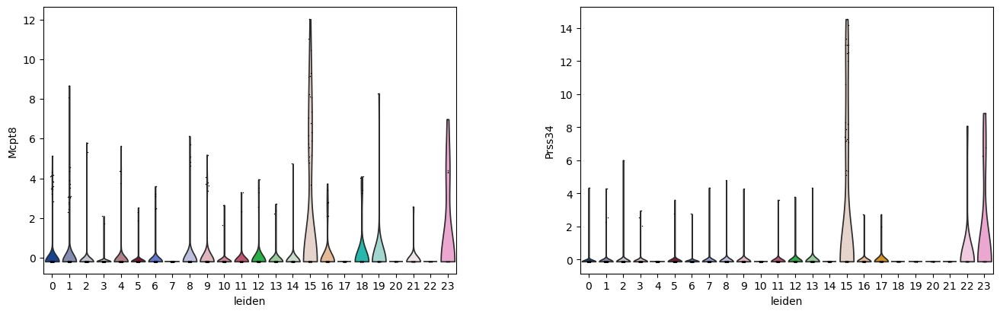

In [106]:
sc.pl.violin(adata, keys = basophil_markers, groupby = "leiden")

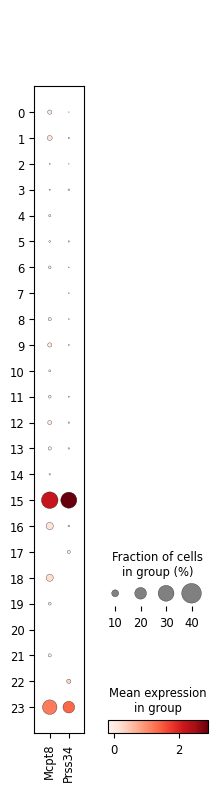

In [107]:
sc.pl.dotplot(adata, var_names = basophil_markers, groupby = "leiden")

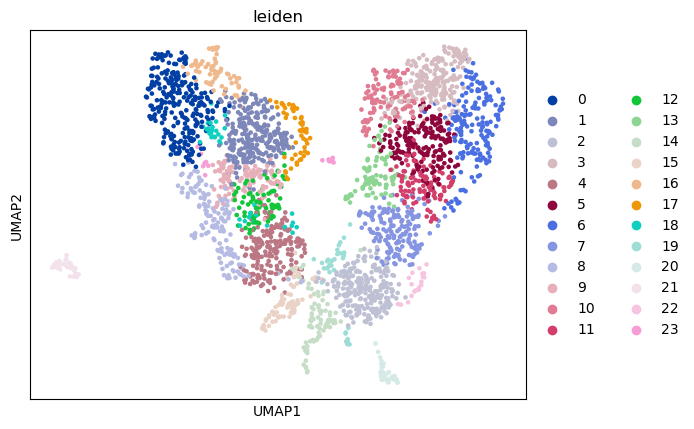

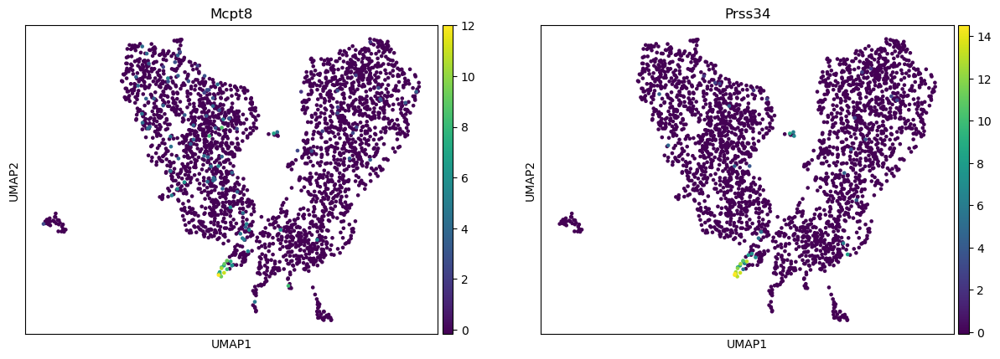

In [108]:
sc.pl.umap(adata, color = "leiden")
sc.pl.umap(adata, color = basophil_markers)

**cell type: mast cells**

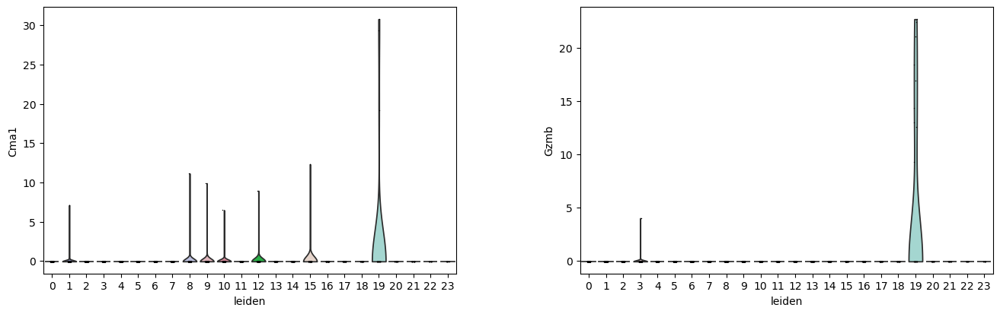

In [109]:
sc.pl.violin(adata, keys = mast_cell_markers, groupby = "leiden")

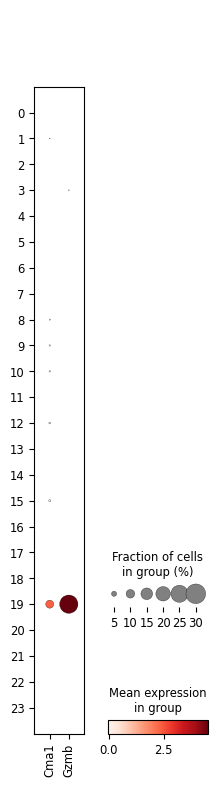

In [110]:
sc.pl.dotplot(adata, var_names = mast_cell_markers, groupby = "leiden")

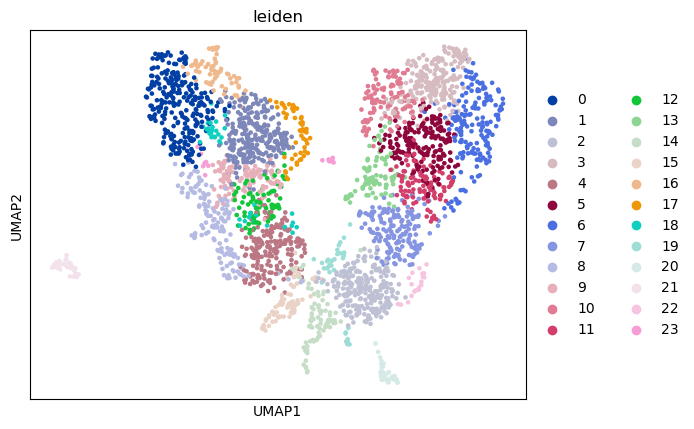

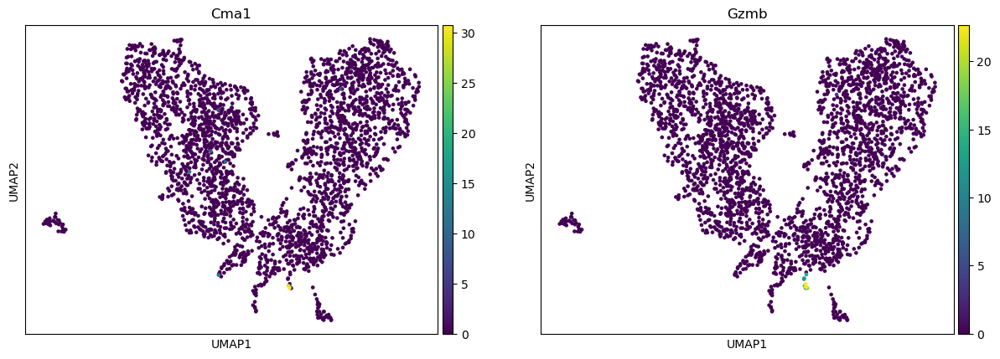

In [111]:
sc.pl.umap(adata, color = "leiden")
sc.pl.umap(adata, color = mast_cell_markers)

Not a bad first attempt at clustering!

Based on these results, I would be pretty confident in making the following cell type annotations:

cluster 0 - neutrophils  
cluster 1 - monocytes  
cluster 3 - erythroid  
cluster 6 - erythroid  
cluster 9 - monocytes  
cluster 10 - erythroid  
cluster 12 - monocytes  
cluster 14 - megakaryocytes  
cluster 15 - basophils  
cluster 16 - neutrophils  
cluster 17 - monocytes  
cluster 18 - neutrophils  
cluster 19 - mast cells  
cluster 21 - monocytes?  
cluster 23 - neutrophils/basophils  

Let's go ahead and add these annotations to our clusters.

In [112]:
adata.obs["leiden"].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23'],
      dtype='object')

In [113]:
# Create a new metadata column with the same cluster assignments.
adata.obs["annotations"] = adata.obs["leiden"]

# Set the new names of the clusters.
cluster_annotations = ['0/neutrophils',
                       '1/monocytes',
                       '2',
                       '3/erythroid',
                       '4',
                       '5',
                       '6/erythroid',
                       '7',
                       '8',
                       '9/monocytes',
                       '10/erythroid',
                       '11',
                       '12/monocytes',
                       '13',
                       '14/megakaryocytes',
                       '15/basophils',
                       '16/neutrophils',
                       '17/monocytes',
                       '18/neutrophils',
                       '19/mast cells',
                       '20',
                       '21/monocytes?',
                       '22',
                       '23/neutrophils & basophils']

# Change the names of the clusters to the inferred cell types.
adata.rename_categories("annotations", cluster_annotations)

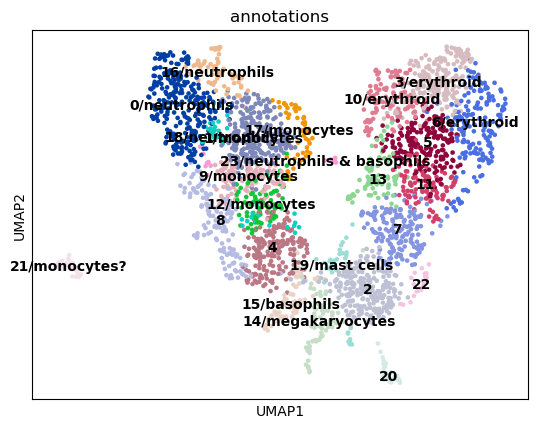

In [114]:
sc.pl.umap(adata, color = "annotations", legend_loc = "on data")


Below, I've labeled each cell according to the annotation that it was originally assigned in the PAGA paper.  What do you notice?

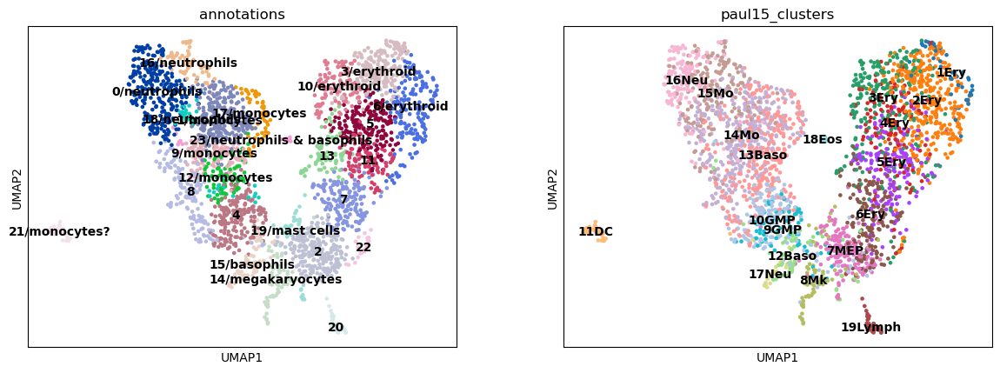

In [115]:
sc.pl.umap(adata, color = ["annotations", "paul15_clusters"], legend_loc = "on data")

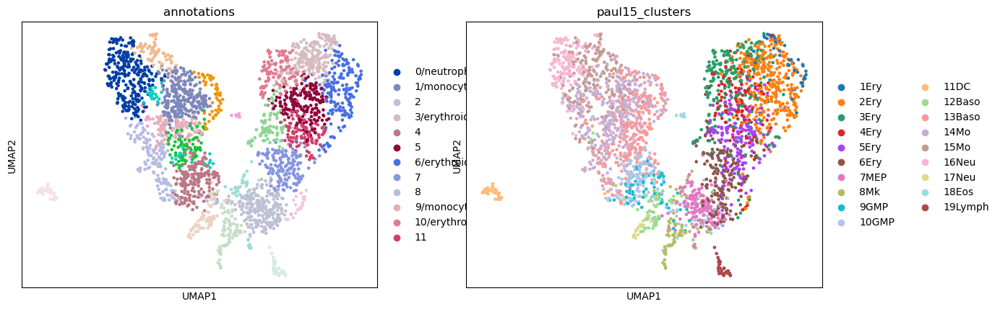

In [116]:
sc.pl.umap(adata, color = ["annotations", "paul15_clusters"])

## **Your turn!**
Select your own parameter values for k and for resolution.  Using these parameter values, run through the clustering procedure for this dataset.  Taking the original annotation as "ground truth," assess whether your clusters produce a better or worse approximation of this "ground truth" than the values we just tried (k = 4, resolution = 1).

We will be using our original parameter values in the next section of the tutorial.  If you'd like, you can use a copy of the "adata" object, created below, to play around with new values.

Don't worry about matching the original clusters perfectly.  We are just experimenting with different values!

In [117]:
# Uncomment the line of code below to play around with a copy of the "adata" object.
# adata_copy = adata.copy()

In [118]:
# Construct the kNN graph.  Use 20 PCs as before.


In [119]:

# Partition the kNN graph to obtain cell clusters.


In [120]:

# Visualize the clusters on a UMAP plot.  Compare this plot to the UMAP plot labeled with the original cell type annotations.


## **Cell fate trajectory inference**

It appears we had pretty decent success annotating our clusters.  However, there are still some clusters we're not so sure about.  Because these data were sampled from developing cells, it's likely some clusters pertain to progenitor states.  Let's now see if we can trace the progression of development of these cells from hematopoietic stem cells to the various mature cell types we identified.

Let's stick with the clusters we first found using our initial parameter values and see if we can infer a reasonable cell fate trajectory that resembles that inferred by the creators of PAGA.

### **Constructing the coarse-grained, abstracted graph**
To infer the trajectory, PAGA first constructs a graph to link whole clusters together based on having a significant number of connections between cells in those clusters.

As a point of reference, this was the graph constructed for the PAGA article:

![PAGA graph](./images/PAGA_graph.png "PAGA graph")

Let's see what our graph looks like.  Following the authors' example, we will set our threshold to 0.03.  Any edges with a weight below this threshold will be discarded in the visualization, displaying only the more high-confidence edges.

In [121]:
# Construct the abstracted graph.
sc.tl.paga(adata, groups = "annotations")

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)


--> added 'pos', the PAGA positions (adata.uns['paga'])


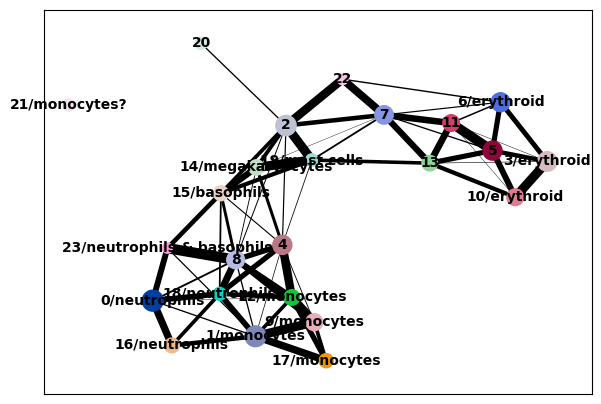

In [122]:
# Display the graph.
sc.pl.paga(adata, color = "annotations", threshold = 0.03)

### **Re-embedding the single cells**
Once we have used the less noisy, abstracted PAGA graph to infer the edges between clusters, we can take advantage of this inferred graph structure to initialize a new embedding of the single cells into the 2D space.  By comparing the coarse-grained PAGA graph with the single-cell embedding below, we can see that the clusters of single cells are basically centered on the coordinates of the corresponding node in the PAGA graph.

In [123]:
# Save the original UMAP embedding.
adata.obsm["X_umap_original"] = adata.obsm["X_umap"].copy()

In [124]:
# Recompute the UMAP embedding, using the abstracted PAGA graph to initialize the embedding procedure.
sc.tl.umap(adata, init_pos = "paga")

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


--> added 'pos', the PAGA positions (adata.uns['paga'])


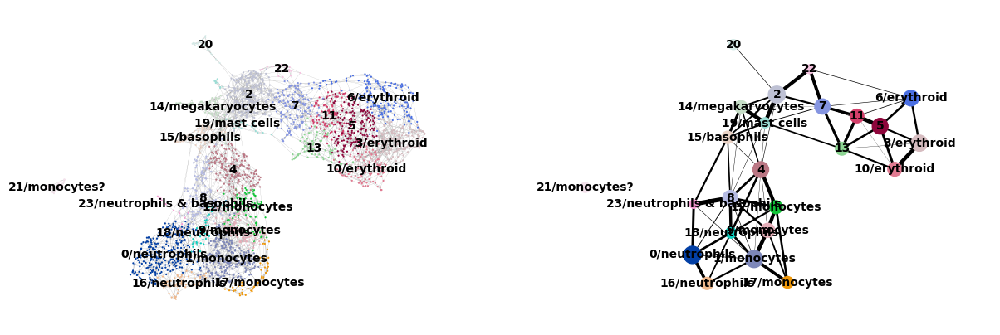

In [125]:
# Compare the new single-cell embedding with the abstracted PAGA graph.
sc.pl.paga_compare(adata, title = "", threshold = 0.03, size = 10, edge_width_scale = 0.5, legend_fontsize = 10, fontsize = 10, frameon = False, edges = True)

What this means is that we can use the topological information that's inferred in the construction of the abstracted PAGA graph to re-embed the individual cells in such a way that we preserve not only local similarity relationships, but also global similarity relationships.  Let's see an example.

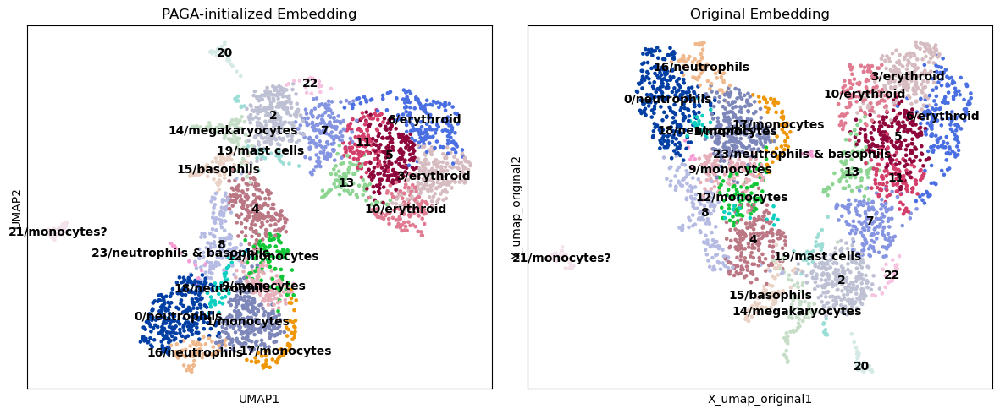

In [126]:
# Compare the new embedding initialized by PAGA with the original embedding.
fig, axs = pl.subplots(1, 2, figsize=(12, 5))

sc.pl.umap(adata, color = "annotations", legend_loc = "on data", ax = axs[0], title = "PAGA-initialized Embedding", show = False)
sc.pl.embedding(adata, basis = "X_umap_original", color = "annotations", legend_loc = "on data", ax = axs[1], title = "Original Embedding", show = False)

pl.tight_layout()
pl.show()

### **Inferring the trajectory**

Now that we have inferred relationships between different cell types and the arrangement of the cells, we can now infer the cell fate trajectory!

To figure out the direction of the trajectory, we first need to identify where it begins.  In other words, we need to select a root cell.

Unfortunately, our dataset does not seem to contain hematopoietic stem cell (HSC) markers, such as Procr, Sca-1, or c-Kit, likely due to the process used to enrich for myeloid progenitors.  Let's examine the number of genes expressed in each cluster to see if that helps us determine which cluster is most likely to contain HSCs.

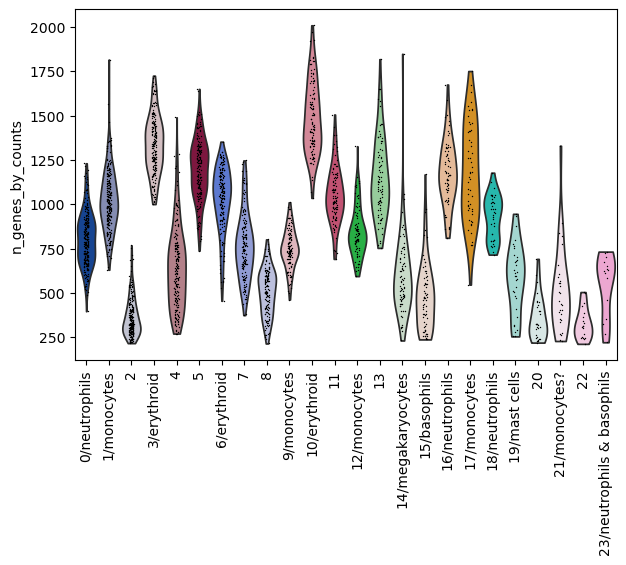

In [127]:
# Plot the distribution of the number of detected genes per cluster.
sc.pl.violin(adata, "n_genes_by_counts", groupby = "annotations", rotation = 90)

Based on their position in the PAGA graph in relation to the other clusters, we might expect cluster 2 or 22 to contain the HSCs.  Surprisingly, these clusters have the lowest number of detected genes, contrary to what would normally be expected for a progenitor population.  Even so, let's go ahead and designate a random cell in cluster 2 as the root of our trajectory.

In [128]:
# Set a cell in cluster 2 as the root.
adata.uns["iroot"] = np.flatnonzero(adata.obs["annotations"]  == "2")[0]

Now we can calculate each cell's developmental distance from the root cell--its pseudotime.

In [129]:
# Calculate every cell's pseudotime along the trajectory.
sc.tl.diffmap(adata, n_comps = 10)
sc.tl.dpt(adata)

computing Diffusion Maps using n_comps=10(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         1.         0.99894565 0.99639004 0.9940461  0.9891783
     0.9875784  0.9852593  0.9825015  0.97943896]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


Finally, we can visualize the inferred developmental trajectory of the cells, indicated by their pseudotime.

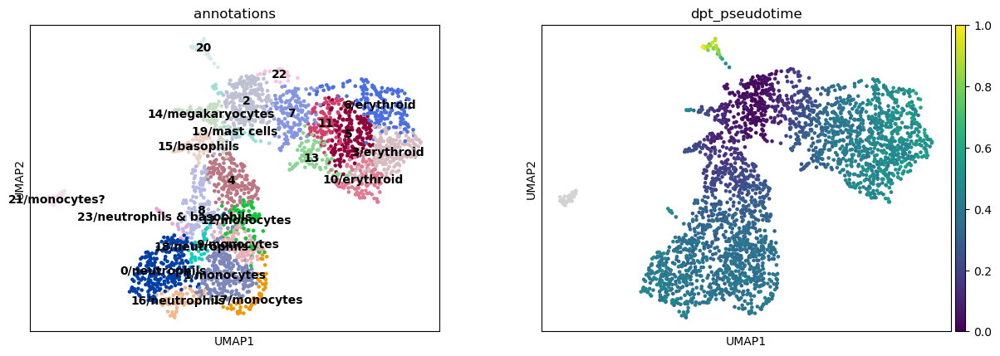

In [130]:
# Visualize the developmental trajectory of the cells.
sc.pl.umap(adata, color = ["annotations", "dpt_pseudotime"], legend_loc = "on data")

To see the actual inferred paths cells can take through different states, we can overlay pseudotime onto the more coarse-grained PAGA graph.

--> added 'pos', the PAGA positions (adata.uns['paga'])


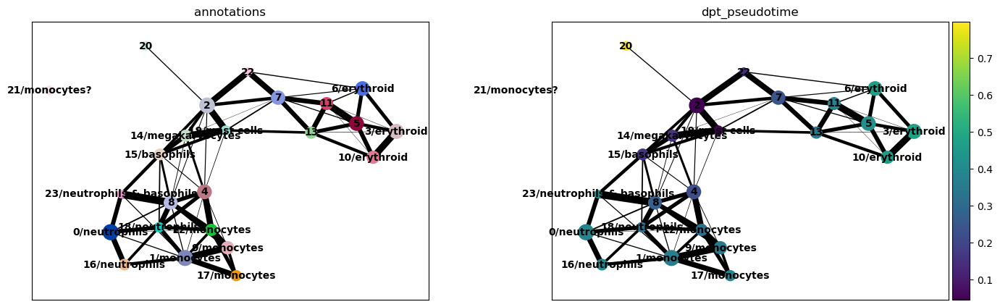

In [131]:
# Visualize the developmental trajectory of the cells.
sc.pl.paga(adata, color = ["annotations", "dpt_pseudotime"], threshold = 0.03)

## **Your turn!**
The cell fate trajectory inferred by the authors of the PAGA paper looks like this:

![cell fate trajectory](./images/cell_fate_trajectory.png "cell fate trajectory")

Experiment with different parameters to see if you can infer a trajectory that looks more like theirs.

Try using the values for k and resolution you selected earlier.  Since it's unclear right now which cluster(s) contain HSCs, try starting the trajectory in different clusters.  Feel free to try different edge weight thresholds when visualizing your PAGA graph!

In [132]:
# Construct the abstracted PAGA graph.


In [133]:
# Use the PAGA graph to initialize the UMAP embedding of the single cells.


In [134]:
# Select a root cell.


In [135]:
# Calculate cells' pseudotime.


In [136]:
# Visualize the cell fate trajectory.
